In [1]:
from IPython.display import HTML
from matplotlib.animation import FuncAnimation
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
import numpy as np
import sympy as sm
import sympy.physics.mechanics as me

me.init_vprinting(use_latex='mathjax')

In [2]:
class ReferenceFrame(me.ReferenceFrame):

    def __init__(self, *args, **kwargs):

        kwargs.pop('latexs', None)

        lab = args[0].lower()
        tex = r'\hat{{{}}}_{}'

        super(ReferenceFrame, self).__init__(*args,
                                             latexs=(tex.format(lab, 'x'),
                                                     tex.format(lab, 'y'),
                                                     tex.format(lab, 'z')),
                                             **kwargs)
me.ReferenceFrame = ReferenceFrame

In [3]:
q1, q2, q3, q4, q5 = me.dynamicsymbols('q1, q2, q3, q4, q5')
u1, u2, u3, u4, u5 = me.dynamicsymbols('u1, u2, u3, u4, u5')
l, I, m = sm.symbols('l, I, m')
t = me.dynamicsymbols._t

p = sm.Matrix([l, I, m])
q = sm.Matrix([q1, q2, q3, q4, q5])
us = sm.Matrix([u3, u4, u5])
ur = sm.Matrix([u1, u2])
u = ur.col_join(us)

q, ur, us, u, p

⎛⎡q₁⎤              ⎡u₁⎤     ⎞
⎜⎢  ⎥              ⎢  ⎥     ⎟
⎜⎢q₂⎥        ⎡u₃⎤  ⎢u₂⎥  ⎡l⎤⎟
⎜⎢  ⎥  ⎡u₁⎤  ⎢  ⎥  ⎢  ⎥  ⎢ ⎥⎟
⎜⎢q₃⎥, ⎢  ⎥, ⎢u₄⎥, ⎢u₃⎥, ⎢I⎥⎟
⎜⎢  ⎥  ⎣u₂⎦  ⎢  ⎥  ⎢  ⎥  ⎢ ⎥⎟
⎜⎢q₄⎥        ⎣u₅⎦  ⎢u₄⎥  ⎣m⎦⎟
⎜⎢  ⎥              ⎢  ⎥     ⎟
⎝⎣q₅⎦              ⎣u₅⎦     ⎠

In [4]:
qd = q.diff()
urd = ur.diff(t)
usd = us.diff(t)
ud = u.diff(t)

qd, urd, usd, ud

⎛⎡q₁̇⎤              ⎡u₁̇⎤⎞
⎜⎢  ⎥              ⎢  ⎥⎟
⎜⎢q₂̇⎥        ⎡u₃̇⎤  ⎢u₂̇⎥⎟
⎜⎢  ⎥  ⎡u₁̇⎤  ⎢  ⎥  ⎢  ⎥⎟
⎜⎢q₃̇⎥, ⎢  ⎥, ⎢u₄̇⎥, ⎢u₃̇⎥⎟
⎜⎢  ⎥  ⎣u₂̇⎦  ⎢  ⎥  ⎢  ⎥⎟
⎜⎢q₄̇⎥        ⎣u₅̇⎦  ⎢u₄̇⎥⎟
⎜⎢  ⎥              ⎢  ⎥⎟
⎝⎣q₅̇⎦              ⎣u₅̇⎦⎠

In [5]:
qd_zero = {qdi: 0 for qdi in qd}
ur_zero = {ui: 0 for ui in ur}
us_zero = {ui: 0 for ui in us}
urd_zero = {udi: 0 for udi in urd}
usd_zero = {udi: 0 for udi in usd}

qd_zero, ur_zero, us_zero

({q₁̇: 0, q₂̇: 0, q₃̇: 0, q₄̇: 0, q₅̇: 0}, {u₁: 0, u₂: 0}, {u₃: 0, u₄: 0, u₅: 0})

In [6]:
urd_zero, usd_zero

({u₁̇: 0, u₂̇: 0}, {u₃̇: 0, u₄̇: 0, u₅̇: 0})

In [7]:
N = me.ReferenceFrame('N')
A = me.ReferenceFrame('A')
B = me.ReferenceFrame('B')
C = me.ReferenceFrame('C')

A.orient_axis(N, q3, N.z)
B.orient_axis(A, q4, A.z)
C.orient_axis(A, q5, A.z)

A.ang_vel_in(N)
B.ang_vel_in(N)
C.ang_vel_in(N)

O = me.Point('O')
Ao = me.Point('A_o')
Bo = me.Point('B_o')
Co = me.Point('C_o')

Ao.set_pos(O, q1*N.x + q2*N.y)
Bo.set_pos(Ao, l/2*A.x)
Co.set_pos(Ao, -l/2*A.x)

O.set_vel(N, 0)
Bo.v2pt_theory(Ao, N, A)
Co.v2pt_theory(Ao, N, A);

In [8]:
fk = sm.Matrix([
    u1 - q1.diff(t),
    u2 - q2.diff(t),
    u3 - l*q3.diff(t)/2,
    u4 - q4.diff(t),
    u5 - q5.diff(t),
])

In [9]:
me.find_dynamicsymbols(fk)

{q₁, q₂, q₃, q₄, q₅, u₁, u₂, u₃, u₄, u₅, q₁̇, q₂̇, q₃̇, q₄̇, q₅̇}

In [10]:
Mk = fk.jacobian(qd)
gk = fk.xreplace(qd_zero)
qd_sol = -Mk.LUsolve(gk)
qd_repl = dict(zip(qd, qd_sol))
qd_repl

⎧                    2⋅u₃                ⎫
⎨q₁̇: u₁, q₂̇: u₂, q₃̇: ────, q₄̇: u₄, q₅̇: u₅⎬
⎩                     l                  ⎭

In [11]:
fn = sm.Matrix([Bo.vel(N).dot(B.y), Co.vel(N).dot(C.y)])
fn

⎡ l⋅cos(q₄)⋅q₃̇                                                                 ↪
⎢ ──────────── + (-sin(q₃)⋅sin(q₄) + cos(q₃)⋅cos(q₄))⋅q₂̇ + (-sin(q₃)⋅cos(q₄) - ↪
⎢      2                                                                       ↪
⎢                                                                              ↪
⎢  l⋅cos(q₅)⋅q₃̇                                                                ↪
⎢- ──────────── + (-sin(q₃)⋅sin(q₅) + cos(q₃)⋅cos(q₅))⋅q₂̇ + (-sin(q₃)⋅cos(q₅)  ↪
⎣       2                                                                      ↪

↪                      ⎤
↪  sin(q₄)⋅cos(q₃))⋅q₁̇ ⎥
↪                      ⎥
↪                      ⎥
↪                      ⎥
↪ - sin(q₅)⋅cos(q₃))⋅q₁̇⎥
↪                      ⎦

In [12]:
fn = fn.xreplace(qd_repl)
fn

⎡(-sin(q₃)⋅sin(q₄) + cos(q₃)⋅cos(q₄))⋅u₂ + (-sin(q₃)⋅cos(q₄) - sin(q₄)⋅cos(q₃) ↪
⎢                                                                              ↪
⎣(-sin(q₃)⋅sin(q₅) + cos(q₃)⋅cos(q₅))⋅u₂ + (-sin(q₃)⋅cos(q₅) - sin(q₅)⋅cos(q₃) ↪

↪ )⋅u₁ + u₃⋅cos(q₄)⎤
↪                  ⎥
↪ )⋅u₁ - u₃⋅cos(q₅)⎦

In [13]:
me.find_dynamicsymbols(fn)

{q₃, q₄, q₅, u₁, u₂, u₃}

In [14]:
Mn = fn.jacobian(ur)
gn = fn.xreplace(ur_zero)
ur_sol = Mn.LUsolve(-gn)
ur_repl = dict(zip(ur, ur_sol))
ur_repl

⎧            ⎛             (-sin(q₃)⋅cos(q₅) - sin(q₅)⋅cos(q₃))⋅u₃⋅cos(q₄)⎞    ↪
⎪            ⎜u₃⋅cos(q₅) + ───────────────────────────────────────────────⎟⋅(- ↪
⎪            ⎝                   -sin(q₃)⋅cos(q₄) - sin(q₄)⋅cos(q₃)       ⎠    ↪
⎪    - ─────────────────────────────────────────────────────────────────────── ↪
⎪        (-sin(q₃)⋅sin(q₄) + cos(q₃)⋅cos(q₄))⋅(-sin(q₃)⋅cos(q₅) - sin(q₅)⋅cos( ↪
⎨      - ───────────────────────────────────────────────────────────────────── ↪
⎪                           -sin(q₃)⋅cos(q₄) - sin(q₄)⋅cos(q₃)                 ↪
⎪u₁: ───────────────────────────────────────────────────────────────────────── ↪
⎪                                                  -sin(q₃)⋅cos(q₄) - sin(q₄)⋅ ↪
⎪                                                                              ↪
⎩                                                                              ↪

↪                                                                              ↪
↪ sin(q₃)⋅sin(q₄) + cos(q₃)

In [15]:
me.find_dynamicsymbols(ur_sol)

{q₃, q₄, q₅, u₃}

In [16]:
gk = gk.xreplace(ur_repl)

me.find_dynamicsymbols(gk)

{q₃, q₄, q₅, u₃, u₄, u₅}

In [17]:
N_w_A = A.ang_vel_in(N).xreplace(qd_repl).xreplace(ur_repl)
N_w_B = B.ang_vel_in(N).xreplace(qd_repl).xreplace(ur_repl)
N_w_C = C.ang_vel_in(N).xreplace(qd_repl).xreplace(ur_repl)
N_v_Ao = Ao.vel(N).xreplace(qd_repl).xreplace(ur_repl)
N_v_Bo = Bo.vel(N).xreplace(qd_repl).xreplace(ur_repl)
N_v_Co = Co.vel(N).xreplace(qd_repl).xreplace(ur_repl)

vels = (N_w_A, N_w_B, N_w_C, N_v_Ao, N_v_Bo, N_v_Co)

for vel in vels:
    print(me.find_dynamicsymbols(vel, reference_frame=N))

{u3(t)}
{u3(t), u4(t)}
{u3(t), u5(t)}
{u3(t), q3(t), q5(t), q4(t)}
{u3(t), q3(t), q5(t), q4(t)}
{u3(t), q3(t), q5(t), q4(t)}


In [18]:
w_A, w_B, w_C, v_Ao, v_Bo, v_Co = me.partial_velocity(vels, us, N)

In [19]:
fnd = fn.diff(t).xreplace(qd_repl)

me.find_dynamicsymbols(fnd)

{q₃, q₄, q₅, u₁, u₂, u₃, u₄, u₅, u₁̇, u₂̇, u₃̇}

In [20]:
Mnd = fnd.jacobian(urd)
gnd = fnd.xreplace(urd_zero).xreplace(ur_repl)
urd_sol = Mnd.LUsolve(-gnd)
urd_repl = dict(zip(urd, urd_sol))

me.find_dynamicsymbols(urd_sol)

{q₃, q₄, q₅, u₃, u₄, u₅, u₃̇}

In [21]:
Rs_Ao = -m*Ao.acc(N)
Rs_Bo = -m*Bo.acc(N)
Rs_Co = -m*Co.acc(N)

(me.find_dynamicsymbols(Rs_Ao, reference_frame=N) |
 me.find_dynamicsymbols(Rs_Bo, reference_frame=N) |
 me.find_dynamicsymbols(Rs_Co, reference_frame=N))

{q₁, q₂, q₃, q₁̈, q₂̈, q₃̇, q₃̈}

In [22]:
qdd_repl = {k.diff(t): v.diff(t).xreplace(urd_repl) for k, v in qd_repl.items()}

In [23]:
Rs_Ao = -m*Ao.acc(N).xreplace(qdd_repl).xreplace(qd_repl)
Rs_Bo = -m*Bo.acc(N).xreplace(qdd_repl).xreplace(qd_repl)
Rs_Co = -m*Co.acc(N).xreplace(qdd_repl).xreplace(qd_repl)

(me.find_dynamicsymbols(Rs_Ao, reference_frame=N) |
 me.find_dynamicsymbols(Rs_Bo, reference_frame=N) |
 me.find_dynamicsymbols(Rs_Co, reference_frame=N))

{q₃, q₄, q₅, u₃, u₄, u₅, u₃̇}

In [24]:
I_A_Ao = I*me.outer(A.z, A.z)
I_B_Bo = I*me.outer(B.z, B.z)
I_C_Co = I*me.outer(C.z, C.z)

In [25]:
Ts_A = -A.ang_acc_in(N).dot(I_A_Ao)
Ts_B = -B.ang_acc_in(N).dot(I_B_Bo)
Ts_C = -C.ang_acc_in(N).dot(I_C_Co)

(me.find_dynamicsymbols(Ts_A, reference_frame=N) |
 me.find_dynamicsymbols(Ts_B, reference_frame=N) |
 me.find_dynamicsymbols(Ts_C, reference_frame=N))

{q₃, q₄, q₅, q₃̈, q₄̈, q₅̈}

In [26]:
Ts_A = -A.ang_acc_in(N).dot(I_A_Ao).xreplace(qdd_repl)
Ts_B = -B.ang_acc_in(N).dot(I_B_Bo).xreplace(qdd_repl)
Ts_C = -C.ang_acc_in(N).dot(I_C_Co).xreplace(qdd_repl)

(me.find_dynamicsymbols(Ts_A, reference_frame=N) |
 me.find_dynamicsymbols(Ts_B, reference_frame=N) |
 me.find_dynamicsymbols(Ts_C, reference_frame=N))

{u₃, u₄, u₅, u₃̇, u₄̇, u₅̇}

In [27]:
Frs = []
for i in range(len(us)):
    Frs.append(v_Ao[i].dot(Rs_Ao) + v_Bo[i].dot(Rs_Bo) + v_Co[i].dot(Rs_Co) +
               w_A[i].dot(Ts_A) + w_B[i].dot(Ts_B) + w_C[i].dot(Ts_C))
Frs = sm.Matrix(Frs)

me.find_dynamicsymbols(Frs)

{q₃, q₄, q₅, u₃, u₄, u₅, u₃̇, u₄̇, u₅̇}

In [28]:
Md = Frs.jacobian(usd)
gd = Frs.xreplace(usd_zero)

In [29]:
me.find_dynamicsymbols(Md)

{q₃, q₄, q₅}

In [30]:
me.find_dynamicsymbols(gd)

{q₃, q₄, q₅, u₃, u₄, u₅}

In [31]:
N_w_A = A.ang_vel_in(N).xreplace(qd_repl)
N_w_B = B.ang_vel_in(N).xreplace(qd_repl)
N_w_C = C.ang_vel_in(N).xreplace(qd_repl)
N_v_Ao = Ao.vel(N).xreplace(qd_repl)
N_v_Bo = Bo.vel(N).xreplace(qd_repl)
N_v_Co = Co.vel(N).xreplace(qd_repl)

vels = (N_w_A, N_w_B, N_w_C, N_v_Ao, N_v_Bo, N_v_Co)

for vel in vels:
    print(me.find_dynamicsymbols(vel, reference_frame=N))

{u3(t)}
{u3(t), u4(t)}
{u3(t), u5(t)}
{u1(t), u2(t)}
{u3(t), q3(t), u1(t), u2(t)}
{u3(t), q3(t), u1(t), u2(t)}


In [32]:
w_A, w_B, w_C, v_Ao, v_Bo, v_Co = me.partial_velocity(vels, u, N)

In [33]:
qdd_repl = {k.diff(t): v.diff(t).xreplace(qd_repl) for k, v in qd_repl.items()}
qdd_repl

⎧                    2⋅u₃̇                ⎫
⎨q₁̈: u₁̇, q₂̈: u₂̇, q₃̈: ────, q₄̈: u₄̇, q₅̈: u₅̇⎬
⎩                     l                  ⎭

In [34]:
Rs_Ao = -m*Ao.acc(N).xreplace(qdd_repl)
Rs_Bo = -m*Bo.acc(N).xreplace(qdd_repl)
Rs_Co = -m*Co.acc(N).xreplace(qdd_repl)
Ts_A = -A.ang_acc_in(N).dot(I_A_Ao).xreplace(qdd_repl)
Ts_B = -B.ang_acc_in(N).dot(I_B_Bo).xreplace(qdd_repl)
Ts_C = -C.ang_acc_in(N).dot(I_C_Co).xreplace(qdd_repl)

In [35]:
Frs = []
for i in range(len(u)):
    Frs.append(v_Ao[i].dot(Rs_Ao) + v_Bo[i].dot(Rs_Bo) + v_Co[i].dot(Rs_Co) +
               w_A[i].dot(Ts_A) + w_B[i].dot(Ts_B) + w_C[i].dot(Ts_C))
Frs = sm.Matrix(Frs)

Frs.shape, me.find_dynamicsymbols(Frs)

((5, 1), {u₁, u₂, u₃, u₄, u₅, u₁̇, u₂̇, u₃̇, u₄̇, u₅̇})

In [36]:
An = sm.trigsimp(fn.jacobian(ur).LUsolve(-fn.jacobian(us)))
An

⎡ ⎛    ⎛          sin(q₃ + q₅)⋅cos(q₄)⎞                          ⎞       ⎤
⎢ ⎜    ⎜cos(q₅) + ────────────────────⎟⋅cos(q₃ + q₄)             ⎟       ⎥
⎢ ⎜    ⎝              sin(q₃ + q₄)    ⎠                          ⎟       ⎥
⎢-⎜- ────────────────────────────────────────────────── - cos(q₄)⎟       ⎥
⎢ ⎜    sin(q₃ + q₅)                                              ⎟       ⎥
⎢ ⎜  - ──────────── - sin(q₃)⋅sin(q₅) + cos(q₃)⋅cos(q₅)          ⎟       ⎥
⎢ ⎝    tan(q₃ + q₄)                                              ⎠       ⎥
⎢──────────────────────────────────────────────────────────────────  0  0⎥
⎢                           sin(q₃ + q₄)                                 ⎥
⎢                                                                        ⎥
⎢                            sin(q₃ + q₅)⋅cos(q₄)                        ⎥
⎢                  cos(q₅) + ────────────────────                        ⎥
⎢                                sin(q₃ + q₄)                            ⎥
⎢        ────────────────

In [37]:
fdr = Frs[:2, 0]
fds = Frs[2:, 0]

Frs_tilde = fds + An.transpose()*fdr

Frs_tilde.shape, me.find_dynamicsymbols(Frs_tilde)

((3, 1), {q₃, q₄, q₅, u₁, u₂, u₃, u₄, u₅, u₁̇, u₂̇, u₃̇, u₄̇, u₅̇})

In [38]:
fd = Frs_tilde.col_join(fn)
sm.trigsimp(fd)

⎡                                                   ⎛    ⎛          sin(q₃ + q ↪
⎢                                                   ⎜    ⎜cos(q₅) + ────────── ↪
⎢                                                   ⎜    ⎝              sin(q₃ ↪
⎢                                               3⋅m⋅⎜- ─────────────────────── ↪
⎢      ⎛     2⋅u₃̇⎞       ⎛     2⋅u₃̇⎞                ⎜    sin(q₃ + q₅)          ↪
⎢  2⋅I⋅⎜u₄̇ + ────⎟   2⋅I⋅⎜u₅̇ + ────⎟                ⎜  - ──────────── - sin(q₃ ↪
⎢      ⎝      l  ⎠       ⎝      l  ⎠   4⋅I⋅u₃̇       ⎝    tan(q₃ + q₄)          ↪
⎢- ─────────────── - ─────────────── - ────── + ────────────────────────────── ↪
⎢         l                 l             2                                  s ↪
⎢                                        l                                     ↪
⎢                                                                              ↪
⎢                                                                              ↪
⎢                      

In [39]:
me.find_dynamicsymbols(fd)

{q₃, q₄, q₅, u₁, u₂, u₃, u₄, u₅, u₁̇, u₂̇, u₃̇, u₄̇, u₅̇}

In [40]:
fd = Frs_tilde.xreplace(urd_repl).xreplace(ur_repl)
me.find_dynamicsymbols(fd)

{q₃, q₄, q₅, u₃, u₄, u₅, u₃̇, u₄̇, u₅̇}

In [41]:
Md = fd.jacobian(usd)
gd = fd.xreplace(usd_zero)

In [42]:
me.find_dynamicsymbols(Md)

{q₃, q₄, q₅}

In [43]:
me.find_dynamicsymbols(gd)

{q₃, q₄, q₅, u₃, u₄, u₅}

In [44]:
eval_kd = sm.lambdify((q, us, p), (Mk, gk, Md, gd), cse=True)

In [45]:
def eval_rhs(t, x, p):
    """Returns the time derivative of the states.

    Parameters
    ==========
    t : float
    x : array_like, shape(8,)
       x = [q1, q2, q3, q4, q5, u3, u4, u5]
    p : array_like, shape(3,)
       p = [l, I, m]

    Returns
    =======
    xd : ndarray, shape(8,)
       xd = [q1d, q2d, q3d, q4d, q5d, u3d, u4d, u5d]

    """
    q, us = x[:5], x[5:]

    Mk, gk, Md, gd = eval_kd(q, us, p)

    qd = -np.linalg.solve(Mk, gk.squeeze())
    usd = -np.linalg.solve(Md, gd.squeeze())

    return np.hstack((qd, usd))

In [46]:
p_vals = np.array([
    0.7,  # l [m]
    0.1,  # I [kg*m^2]
    1.0,  # m [kg]
])

q0 = np.array([
    0.0,  # q1 [m]
    0.0,  # q2 [m]
    0.0,  # q3 [rad]
    np.deg2rad(5.0),  # q4 [rad]
    -np.deg2rad(5.0),  # q5 [rad]
])

us0 = np.array([
    0.1,  # u3 [m/s]
    0.01,  # u4 [rad/s]
    -0.01,  # u5 [rad/s]
])

x0 = np.hstack((q0, us0))
p_vals, x0

(array([0.7, 0.1, 1. ]),
 array([ 0.        ,  0.        ,  0.        ,  0.08726646, -0.08726646,
         0.1       ,  0.01      , -0.01      ]))

In [47]:
eval_rhs(1.0, x0, p_vals)

array([ 1.14300523,  0.        ,  0.28571429,  0.01      , -0.01      ,
        0.01143537, -0.03267249, -0.03267249])

In [48]:
t0, tf = 0.0, 8.0

In [49]:
fps = 20
ts = np.linspace(t0, tf, num=int(fps*(tf - t0)))

sol = solve_ivp(eval_rhs, (t0, tf), x0, args=(p_vals,), t_eval=ts)

xs = np.transpose(sol.y)

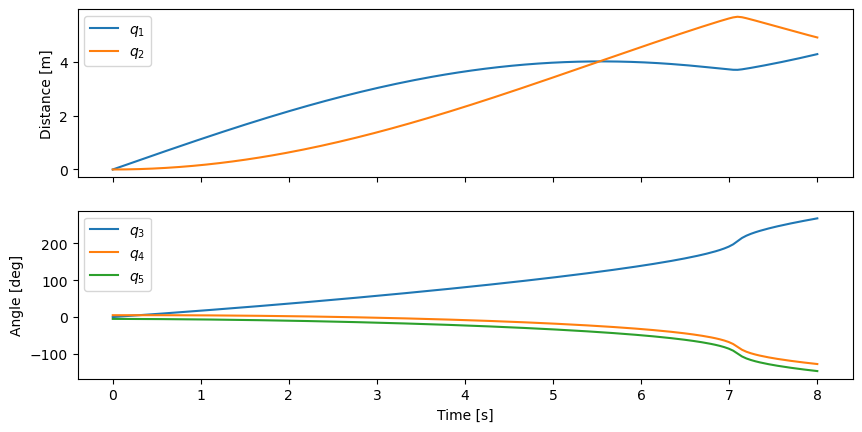

In [50]:
fig, axes = plt.subplots(2, 1, sharex=True)
fig.set_figwidth(10.0)

axes[0].plot(ts, xs[:, :2])
axes[0].legend(('$q_1$', '$q_2$'))
axes[0].set_ylabel('Distance [m]')

axes[1].plot(ts, np.rad2deg(xs[:, 2:5]))
axes[1].legend(('$q_3$', '$q_4$', '$q_5$'))
axes[1].set_ylabel('Angle [deg]')
axes[1].set_xlabel('Time [s]');

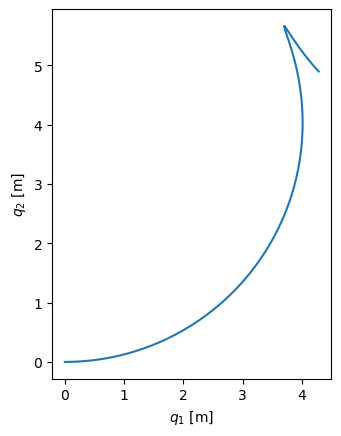

In [51]:
fig, ax = plt.subplots()
fig.set_figwidth(10.0)

ax.plot(xs[:, 0], xs[:, 1])
ax.set_aspect('equal')
ax.set_xlabel('$q_1$ [m]')
ax.set_ylabel('$q_2$ [m]');

In [52]:
Bl = me.Point('B_l')
Br = me.Point('B_r')
Cr = me.Point('C_r')
Cl = me.Point('C_l')

Bl.set_pos(Bo, -l/4*B.y)
Br.set_pos(Bo, l/4*B.y)
Cl.set_pos(Co, -l/4*C.y)
Cr.set_pos(Co, l/4*C.y)

In [53]:
coordinates = Cl.pos_from(O).to_matrix(N)
for point in [Co, Cr, Co, Ao, Bo, Bl, Br]:
    coordinates = coordinates.row_join(point.pos_from(O).to_matrix(N))

eval_point_coords = sm.lambdify((q, p), coordinates, cse=True)
eval_point_coords(q0, p_vals)

array([[-0.36525225, -0.35      , -0.33474775, -0.35      ,  0.        ,
         0.35      ,  0.36525225,  0.33474775],
       [-0.17433407, -0.        ,  0.17433407, -0.        ,  0.        ,
         0.        , -0.17433407,  0.17433407],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ]])

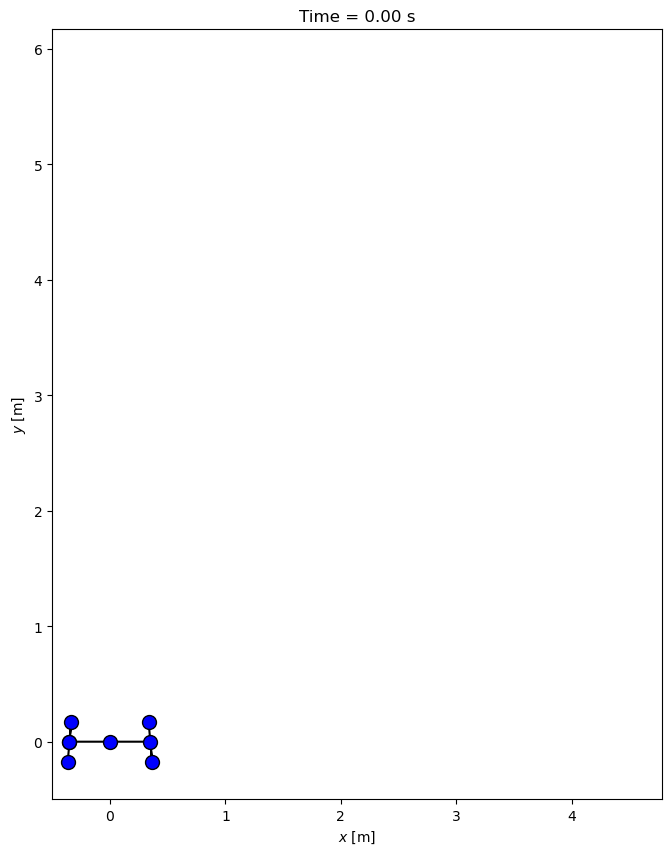

In [54]:
x, y, z = eval_point_coords(q0, p_vals)

fig, ax = plt.subplots()
fig.set_size_inches((10.0, 10.0))
ax.set_aspect('equal')

lines, = ax.plot(x, y, color='black',
                 marker='o', markerfacecolor='blue', markersize=10)
# some empty lines to use for the wheel paths
bl_path, = ax.plot([], [])
br_path, = ax.plot([], [])
cl_path, = ax.plot([], [])
cr_path, = ax.plot([], [])

title_template = 'Time = {:1.2f} s'
title_text = ax.set_title(title_template.format(t0))
ax.set_xlim((np.min(xs[:, 0]) - 0.5, np.max(xs[:, 0]) + 0.5))
ax.set_ylim((np.min(xs[:, 1]) - 0.5, np.max(xs[:, 1]) + 0.5))
ax.set_xlabel('$x$ [m]')
ax.set_ylabel('$y$ [m]');

In [55]:
coords = []
for xi in xs:
     coords.append(eval_point_coords(xi[:5], p_vals))
coords = np.array(coords)  # shape(600, 3, 8)

def animate(i):
    title_text.set_text(title_template.format(sol.t[i]))
    lines.set_data(coords[i, 0, :], coords[i, 1, :])
    cl_path.set_data(coords[:i, 0, 0], coords[:i, 1, 0])
    cr_path.set_data(coords[:i, 0, 2], coords[:i, 1, 2])
    bl_path.set_data(coords[:i, 0, 6], coords[:i, 1, 6])
    br_path.set_data(coords[:i, 0, 7], coords[:i, 1, 7])

ani = FuncAnimation(fig, animate, len(sol.t))

HTML(ani.to_jshtml(fps=fps))

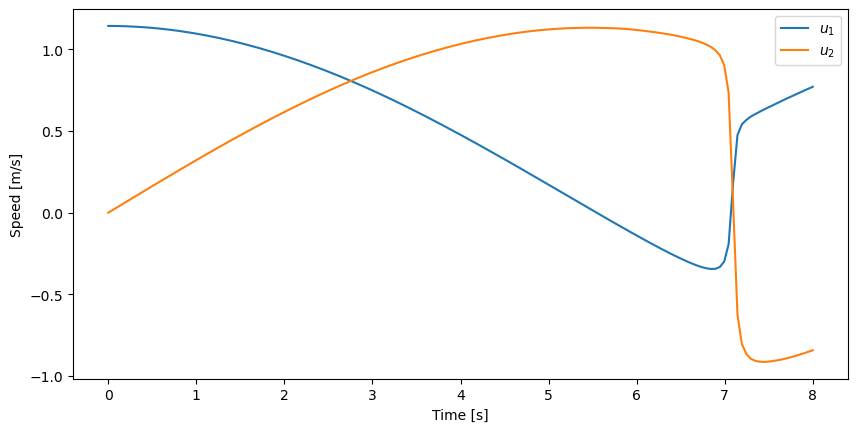

In [56]:
x = sm.Matrix([q1, q2, q3, q4, q5, u3, u4, u5])
eval_ur = sm.lambdify((x, p), ur_sol, cse=True)

ur_vals = []
for xi in xs:
    ur_vals.append(eval_ur(xi, p_vals))
ur_vals = np.array(ur_vals).squeeze()

fig, ax = plt.subplots()
fig.set_figwidth(10.0)
ax.plot(ts, ur_vals)
ax.set_ylabel('Speed [m/s]')
ax.set_xlabel('Time [s]')
ax.legend(['$u_1$', '$u_2$']);